# **Classification of fraudulent transactions**

## **Project Overview**
The primary goal of this project is to analyze fraudulent transaction and build machine learning model that accurately detects fraudulent activities. By leveraging various classification techniques, the project aims to improve fraud detection efficiency and minimize false positives.

## **Data Sources**
- **onlinefraud.csv**  
  - Contains data regarding transactions, including amount, type and account balances (before and after the transaction).
  - Fraudulent transactions are labeled as "1" in the isFraud column.

## **Project Workflow**
### **1. Exploratory Data Analysis (EDA)**
- Conducted an in-depth analysis of transaction distributions and patterns.
- Visualized correlations between features and fraudulent transactions.
- Checked for data imbalances and missing values.
- Encoded categorical variables.
- Added one variable with difference with old and new balance.

### **2. Machine Learning for Fraud Detection**
- Split dataset into training, validating and testing sets.
- Use SMOTE to balance training set.
- Built multiple classification models to predict if transaction is **fraudulent**, including:
    - Logistic Regression,
    - Decision Tree,
    - XGBoost,
    - LGMB,
    - CatBoost.

### **3. Model Evaluation & Comparison**
- Assessed models using key classification metrics:
    - Accuracy - overall correctness of the model.
    - Precision - percentage of correctly identified frauds among all predicted frauds.
    - Recall (Sensitivity) - ability to detect frauds among all actual frauds.
    - F1-score - harmonic mean of precision and recall.
    - Precision-Recall Curve - trade-off between precision and recall.
    - Looking for the best tresholds. Comparing results using optimal tresholds, which maximize precision, recall and F1 score.
- Checking features impact on prediction using SHAP and LIME.
- Identified the best-performing model for fraud detection.

### **4. Conclusions**
- Summarized key findings from the analysis and predictions - more at the end of the project.

In [1]:
import numpy as np
import pandas as pd   
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_curve, auc, average_precision_score, f1_score
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
import lightgbm as lgb
import catboost as cb
from imblearn.over_sampling import SMOTE
import shap
import lime.lime_tabular
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('onlinefraud.csv', delimiter=',')

In [3]:
df.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   nameOrig        object 
 4   oldbalanceOrg   float64
 5   newbalanceOrig  float64
 6   nameDest        object 
 7   oldbalanceDest  float64
 8   newbalanceDest  float64
 9   isFraud         int64  
 10  isFlaggedFraud  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 534.0+ MB


In [5]:
df.shape

(6362620, 11)

In [6]:
df.isnull().sum()

step              0
type              0
amount            0
nameOrig          0
oldbalanceOrg     0
newbalanceOrig    0
nameDest          0
oldbalanceDest    0
newbalanceDest    0
isFraud           0
isFlaggedFraud    0
dtype: int64

In [7]:
df['balanceDifferenceOrig'] = df['oldbalanceOrg'] - df['newbalanceOrig']
df['balanceDifferenceDest'] = df['oldbalanceDest'] - df['newbalanceDest']

In [8]:
df.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0,9839.64,0.0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0,1864.28,0.0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0,181.00,0.0
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0,181.00,21182.0
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0,11668.14,0.0


In [9]:
df.describe()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
count,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06,6.362620e+06
mean,2.433972e+02,1.798619e+05,8.338831e+05,8.551137e+05,1.100702e+06,1.224996e+06,1.290820e-03,2.514687e-06,-2.123056e+04,-1.242947e+05
std,1.423320e+02,6.038582e+05,2.888243e+06,2.924049e+06,3.399180e+06,3.674129e+06,3.590480e-02,1.585775e-03,1.466433e+05,8.129391e+05
min,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.915268e+06,-1.056878e+08
25%,1.560000e+02,1.338957e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.491054e+05
50%,2.390000e+02,7.487194e+04,1.420800e+04,0.000000e+00,1.327057e+05,2.146614e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,3.350000e+02,2.087215e+05,1.073152e+05,1.442584e+05,9.430367e+05,1.111909e+06,0.000000e+00,0.000000e+00,1.015044e+04,0.000000e+00
max,7.430000e+02,9.244552e+07,5.958504e+07,4.958504e+07,3.560159e+08,3.561793e+08,1.000000e+00,1.000000e+00,1.000000e+07,1.306083e+07


isFraud
0    0.998709
1    0.001291
Name: proportion, dtype: float64


<Axes: ylabel='proportion'>

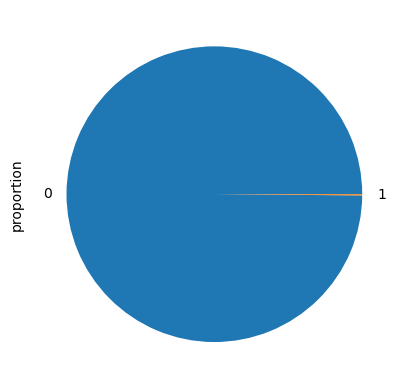

In [10]:
print(df.isFraud.value_counts(normalize = True))
df.isFraud.value_counts(normalize = True).plot.pie()

In [11]:
df['isFraud'].value_counts()

isFraud
0    6354407
1       8213
Name: count, dtype: int64

<Axes: xlabel='type', ylabel='count'>

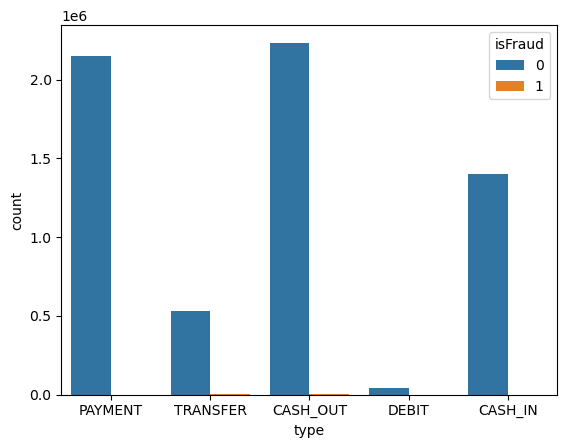

In [12]:
sns.countplot(data=df, x="type", hue=df["isFraud"].astype(str))

type
CASH_OUT    0.351663
PAYMENT     0.338146
CASH_IN     0.219923
TRANSFER    0.083756
DEBIT       0.006512
Name: proportion, dtype: float64


<Axes: ylabel='proportion'>

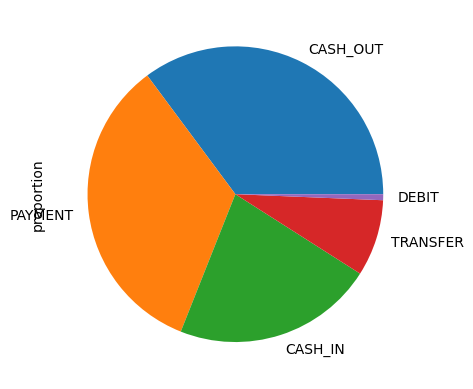

In [13]:
print(df.type.value_counts(normalize = True))
df.type.value_counts(normalize = True).plot.pie()

In [14]:
fraud = df[df['isFraud']==1]
notfraud = df[df['isFraud']==0]

type
CASH_OUT    0.501157
TRANSFER    0.498843
Name: proportion, dtype: float64


<Axes: ylabel='proportion'>

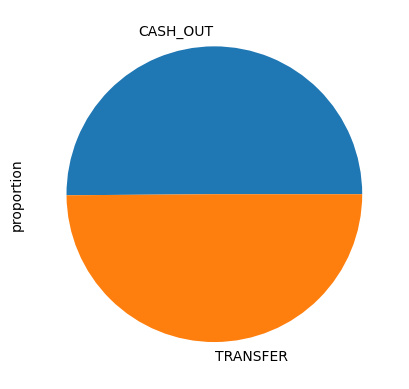

In [15]:
print(fraud.type.value_counts(normalize = True))
fraud.type.value_counts(normalize = True).plot.pie()

In [16]:
df.nlargest(15, 'amount')

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
3686583,276,TRANSFER,92445516.64,C1715283297,0.0,0.0,C439737079,9.595980e+03,9.245511e+07,0,0,0.0,-9.244552e+07
4060598,300,TRANSFER,73823490.36,C2127282686,0.0,0.0,C753026640,9.362401e+07,1.674475e+08,0,0,0.0,-7.382349e+07
4146397,303,TRANSFER,71172480.42,C2044643633,0.0,0.0,C84111522,1.134615e+08,1.846340e+08,0,0,0.0,-7.117248e+07
3946920,286,TRANSFER,69886731.30,C1425667947,0.0,0.0,C167875008,1.515387e+08,2.214254e+08,0,0,0.0,-6.988673e+07
3911956,284,TRANSFER,69337316.27,C1584456031,0.0,0.0,C1472140329,1.130072e+08,1.823446e+08,0,0,0.0,-6.933732e+07
3937152,286,TRANSFER,67500761.29,C811810230,0.0,0.0,C1757599079,8.635615e+07,1.538569e+08,0,0,0.0,-6.750076e+07
4105338,302,TRANSFER,66761272.21,C420748282,0.0,0.0,C1073241084,6.874206e+07,1.355033e+08,0,0,0.0,-6.676127e+07
3892529,284,TRANSFER,64234448.19,C1139847449,0.0,0.0,C65111466,6.597691e+07,1.663021e+08,0,0,0.0,-1.003252e+08
3991638,298,TRANSFER,63847992.58,C300140823,0.0,0.0,C514940761,7.217149e+07,1.360195e+08,0,0,0.0,-6.384799e+07
4143801,303,TRANSFER,63294839.63,C372535854,0.0,0.0,C1871605747,7.512528e+07,1.384201e+08,0,0,0.0,-6.329484e+07


In [17]:
fraud.nlargest(15, 'amount')

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
4440,4,TRANSFER,10000000.0,C7162498,12930418.44,2930418.44,C945327594,0.00,0.00,1,0,10000000.0,0.00
4441,4,CASH_OUT,10000000.0,C351297720,10000000.00,0.00,C766681183,0.00,9941904.21,1,0,10000000.0,-9941904.21
481250,19,TRANSFER,10000000.0,C416779475,11861008.32,1861008.32,C380259496,0.00,0.00,1,0,10000000.0,0.00
481251,19,CASH_OUT,10000000.0,C2050703310,10000000.00,0.00,C1622860679,504326.62,10342417.90,1,0,10000000.0,-9838091.28
586311,33,TRANSFER,10000000.0,C1439740840,19887819.06,9887819.06,C875288652,0.00,0.00,1,0,10000000.0,0.00
586312,33,CASH_OUT,10000000.0,C29118015,10000000.00,0.00,C1379703840,0.00,10000000.00,1,0,10000000.0,-10000000.00
1030559,72,TRANSFER,10000000.0,C53057884,18594065.09,8594065.09,C588547519,0.00,0.00,1,0,10000000.0,0.00
1030560,72,CASH_OUT,10000000.0,C1438388258,10000000.00,0.00,C1089455271,81810.42,10081810.42,1,0,10000000.0,-10000000.00
1030661,82,TRANSFER,10000000.0,C1237313447,10987591.59,987591.59,C1468356154,0.00,0.00,1,0,10000000.0,0.00
1030662,82,CASH_OUT,10000000.0,C1079335762,10000000.00,0.00,C615227407,373274.84,10373274.84,1,0,10000000.0,-10000000.00


In [18]:
notfraud.nlargest(15, 'amount')

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
3686583,276,TRANSFER,92445516.64,C1715283297,0.0,0.0,C439737079,9.595980e+03,9.245511e+07,0,0,0.0,-9.244552e+07
4060598,300,TRANSFER,73823490.36,C2127282686,0.0,0.0,C753026640,9.362401e+07,1.674475e+08,0,0,0.0,-7.382349e+07
4146397,303,TRANSFER,71172480.42,C2044643633,0.0,0.0,C84111522,1.134615e+08,1.846340e+08,0,0,0.0,-7.117248e+07
3946920,286,TRANSFER,69886731.30,C1425667947,0.0,0.0,C167875008,1.515387e+08,2.214254e+08,0,0,0.0,-6.988673e+07
3911956,284,TRANSFER,69337316.27,C1584456031,0.0,0.0,C1472140329,1.130072e+08,1.823446e+08,0,0,0.0,-6.933732e+07
3937152,286,TRANSFER,67500761.29,C811810230,0.0,0.0,C1757599079,8.635615e+07,1.538569e+08,0,0,0.0,-6.750076e+07
4105338,302,TRANSFER,66761272.21,C420748282,0.0,0.0,C1073241084,6.874206e+07,1.355033e+08,0,0,0.0,-6.676127e+07
3892529,284,TRANSFER,64234448.19,C1139847449,0.0,0.0,C65111466,6.597691e+07,1.663021e+08,0,0,0.0,-1.003252e+08
3991638,298,TRANSFER,63847992.58,C300140823,0.0,0.0,C514940761,7.217149e+07,1.360195e+08,0,0,0.0,-6.384799e+07
4143801,303,TRANSFER,63294839.63,C372535854,0.0,0.0,C1871605747,7.512528e+07,1.384201e+08,0,0,0.0,-6.329484e+07


In [19]:
df[df['newbalanceOrig']==0.0]

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balanceDifferenceOrig,balanceDifferenceDest
2,1,TRANSFER,181.00,C1305486145,181.00,0.0,C553264065,0.00,0.00,1,0,181.00,0.00
3,1,CASH_OUT,181.00,C840083671,181.00,0.0,C38997010,21182.00,0.00,1,0,181.00,21182.00
8,1,PAYMENT,4024.36,C1265012928,2671.00,0.0,M1176932104,0.00,0.00,0,0,2671.00,0.00
10,1,DEBIT,9644.94,C1900366749,4465.00,0.0,C997608398,10845.00,157982.12,0,0,4465.00,-147137.12
13,1,PAYMENT,11633.76,C1716932897,10127.00,0.0,M801569151,0.00,0.00,0,0,10127.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6362615,743,CASH_OUT,339682.13,C786484425,339682.13,0.0,C776919290,0.00,339682.13,1,0,339682.13,-339682.13
6362616,743,TRANSFER,6311409.28,C1529008245,6311409.28,0.0,C1881841831,0.00,0.00,1,0,6311409.28,0.00
6362617,743,CASH_OUT,6311409.28,C1162922333,6311409.28,0.0,C1365125890,68488.84,6379898.11,1,0,6311409.28,-6311409.27
6362618,743,TRANSFER,850002.52,C1685995037,850002.52,0.0,C2080388513,0.00,0.00,1,0,850002.52,0.00


How many transactions among this one, that have new balance=0.0 are fraudulent?

isFraud
0    0.997769
1    0.002231
Name: proportion, dtype: float64


<Axes: ylabel='proportion'>

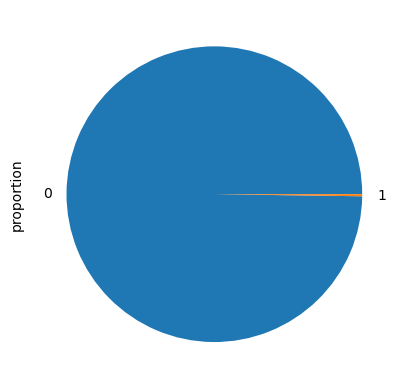

In [20]:
print(df[df['newbalanceOrig']==0.0].isFraud.value_counts(normalize = True))
df[df['newbalanceOrig']==0.0].isFraud.value_counts(normalize = True).plot.pie()

In [21]:
df[['type']] = df[['type']].replace('PAYMENT', 1).replace('TRANSFER', 2).replace('CASH_OUT', 3).replace('DEBIT', 4).replace('CASH_IN', 5)

In [22]:
X = df[["step", "type", "amount", "oldbalanceOrg", "newbalanceOrig", "oldbalanceDest", "newbalanceDest", "balanceDifferenceOrig", "balanceDifferenceDest"]]

In [23]:
X.corr()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,balanceDifferenceOrig,balanceDifferenceDest
step,1.000000,-0.001992,0.022373,-0.010058,-0.010299,0.027665,0.025888,0.007255,-0.001325
type,-0.001992,1.000000,0.050693,0.415700,0.431006,0.165383,0.135362,-0.406708,0.079747
amount,0.022373,0.050693,1.000000,-0.002762,-0.007861,0.294137,0.459304,0.102337,-0.845964
oldbalanceOrg,-0.010058,0.415700,-0.002762,1.000000,0.998803,0.066243,0.042029,-0.220297,0.087032
newbalanceOrig,-0.010299,0.431006,-0.007861,0.998803,1.000000,0.067812,0.041837,-0.267750,0.094456
oldbalanceDest,0.027665,0.165383,0.294137,0.066243,0.067812,1.000000,0.976569,-0.047460,-0.232316
newbalanceDest,0.025888,0.135362,0.459304,0.042029,0.041837,0.976569,1.000000,-0.006451,-0.436191
balanceDifferenceOrig,0.007255,-0.406708,0.102337,-0.220297,-0.267750,-0.047460,-0.006451,1.000000,-0.169292
balanceDifferenceDest,-0.001325,0.079747,-0.845964,0.087032,0.094456,-0.232316,-0.436191,-0.169292,1.000000


oldbalanceOrg with newbalanceOrg and oldbalanceDest with newbalanceDest have high correlation, so we delete these data from model

In [24]:
X = df[["step", "type", "amount", "newbalanceOrig", "newbalanceDest", "balanceDifferenceOrig"]]

In [25]:
y = df[["isFraud"]]

In [26]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

standardization of features

In [27]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [28]:
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

In [29]:
def drawPlots(X_test, y_test, y_pred, model):

    y_scores = model.predict_proba(X_test)[:, 1]

    precision, recall, thresholds = precision_recall_curve(y_test, y_scores)
    print("AP: ", average_precision_score(y_test, y_scores))
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    
    ax[0].plot(recall, precision, marker='.', label='Precision-Recall Curve')
    ax[0].plot(thresholds, precision[:-1], "b-", label="Precision")
    ax[0].plot(thresholds, recall[:-1], "r-", label="Recall")
    ax[0].set_xlabel('Recall')
    ax[0].set_ylabel('Precision')
    ax[0].set_title("Precision-Recall Curve")
    ax[0].legend()
    
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", ax=ax[1])
    ax[1].set_xlabel("Predicted")
    ax[1].set_ylabel("Actual")
    ax[1].set_title("Confusion Matrix")

    y_pred_proba = model.predict_proba(X_test)[:, 1]
    ax[2].hist(y_pred_proba, bins=50, edgecolor='black')
    ax[2].set_xlabel("Probability class 1")
    ax[2].set_ylabel("Count")
    ax[2].set_title("Probability distribution")

    plt.show()

In [30]:
def countTresholds(X_test, y_test, model):
    y_scores = model.predict_proba(X_test)[:, 1]

    precision, recall, thresholds = precision_recall_curve(y_test, y_scores)
    pr_auc = auc(recall, precision)

    optimal_idx_f1 = np.argmax(2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + 1e-9))
    optimal_idx_precision = np.argmax(precision[:-1])
    optimal_idx_recall = np.argmax(recall[:-1])

    optimal_threshold_f1 = thresholds[optimal_idx_f1]
    optimal_threshold_precision = thresholds[optimal_idx_precision]
    optimal_threshold_recall = thresholds[optimal_idx_recall]

    print(f"Optimal treshold max F1: {optimal_threshold_f1:.5f}")
    print(f"Optimal treshold max Precision: {optimal_threshold_precision:.5f}")
    print(f"Optimal treshold max Recall: {optimal_threshold_recall:.5f}")

    return {'f1': optimal_threshold_f1, 'precision': optimal_threshold_precision, 'recall': optimal_threshold_recall}

In [31]:
def errorMatrix(tresholds, model):

    for i in tresholds:
        print(f"Treshold max {i} = {tresholds[i]}")
        y_scores = model.predict_proba(X_test)[:, 1]
        y_pred_adjusted = (y_scores > tresholds[i]).astype(int)

        print(classification_report(y_test, y_pred_adjusted))
        print("Error matrix:")
        print(confusion_matrix(y_test, y_pred_adjusted))

        fig, ax = plt.subplots(1, 2, figsize=(12, 4))

        sns.heatmap(confusion_matrix(y_test, y_pred_adjusted), annot=True, fmt="d", cmap="Blues", ax=ax[0])
        ax[0].set_xlabel("Predicted")
        ax[0].set_ylabel("Actual")
        ax[0].set_title("Confusion Matrix")

        ax[1].hist(y_pred_adjusted, bins=50, edgecolor='black')
        ax[1].set_xlabel("Probability class 1")
        ax[1].set_ylabel("Count")
        ax[1].set_title("Probability distribution")
    
        plt.show()

# Logistic Regression

In [33]:
model_log = LogisticRegression(C=0.1, penalty='l1', solver='liblinear', class_weight='balanced')

In [34]:
model_log.fit(X_train_sm, y_train_sm.squeeze())

y_pred_log = model_log.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_log))
print(classification_report(y_test, y_pred_log))
print("Error matrix:")
print(confusion_matrix(y_test, y_pred_log))

Accuracy: 0.9542379292387937
              precision    recall  f1-score   support

           0       1.00      0.95      0.98    953161
           1       0.02      0.85      0.05      1232

    accuracy                           0.95    954393
   macro avg       0.51      0.90      0.51    954393
weighted avg       1.00      0.95      0.98    954393

Error matrix:
[[909673  43488]
 [   187   1045]]


AP:  0.48292451969448946


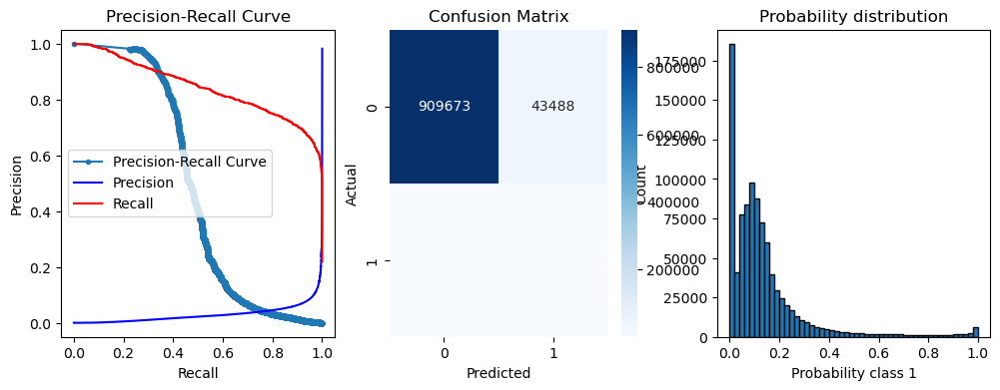

In [35]:
drawPlots(X_test, y_test, y_pred_log, model_log)

In [36]:
tresholds = countTresholds(X_test, y_test, model_log)

Optimal treshold max F1: 1.00000
Optimal treshold max Precision: 1.00000
Optimal treshold max Recall: 0.00000


Treshold max f1 = 0.9999952447280521
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.75      0.41      0.53      1232

    accuracy                           1.00    954393
   macro avg       0.88      0.71      0.77    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[952995    166]
 [   724    508]]


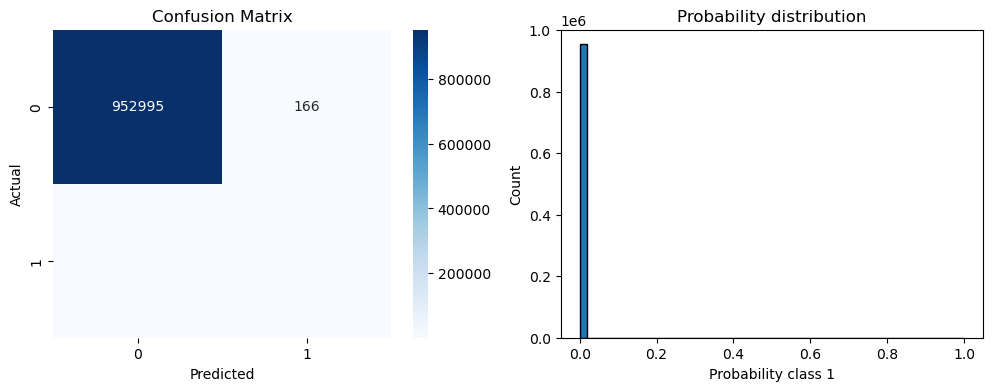

Treshold max precision = 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.00      0.00      0.00      1232

    accuracy                           1.00    954393
   macro avg       0.50      0.50      0.50    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [  1232      0]]


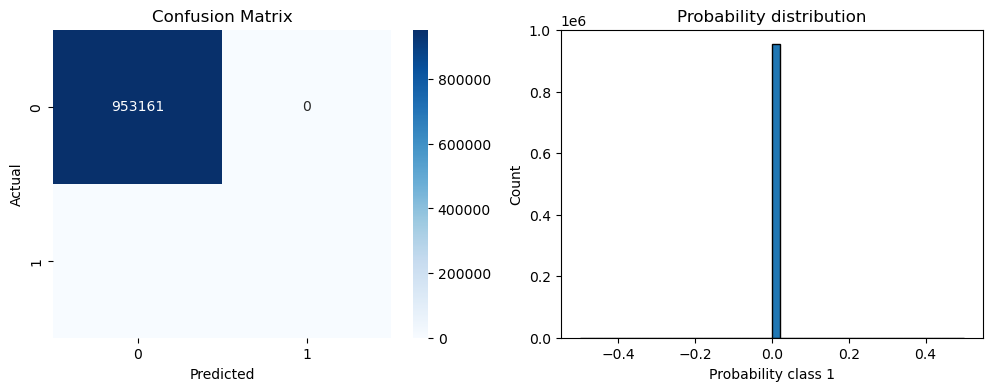

Treshold max recall = 7.545283256947686e-108
              precision    recall  f1-score   support

           0       1.00      0.00      0.00    953161
           1       0.00      1.00      0.00      1232

    accuracy                           0.00    954393
   macro avg       0.50      0.50      0.00    954393
weighted avg       1.00      0.00      0.00    954393

Error matrix:
[[     1 953160]
 [     0   1232]]


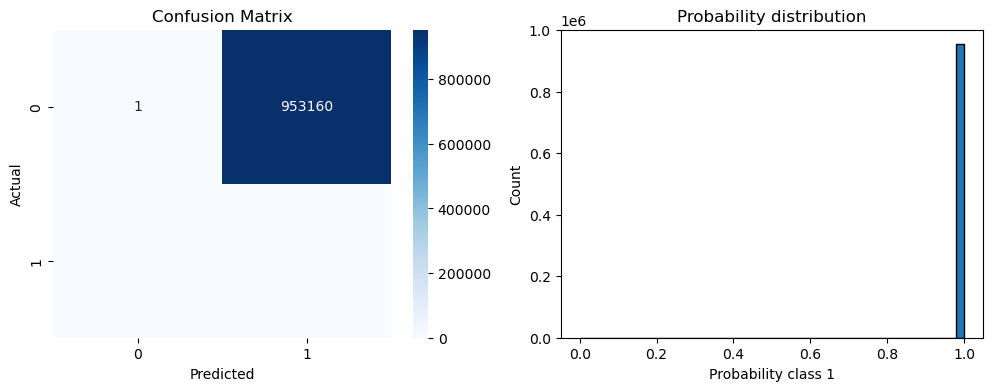

In [37]:
errorMatrix(tresholds, model_log)

# Decision Tree

In [38]:
model_tree = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_leaf=10, min_samples_split=5, class_weight='balanced')

In [39]:
model_tree.fit(X_train_sm, y_train_sm.squeeze())

y_pred_tree = model_tree.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_tree))
print(classification_report(y_test, y_pred_tree))
print("Error matrix:")
print(confusion_matrix(y_test, y_pred_tree))

Accuracy: 0.999185869971804
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.62      0.97      0.75      1232

    accuracy                           1.00    954393
   macro avg       0.81      0.99      0.88    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[952419    742]
 [    35   1197]]


AP:  0.729211840961898


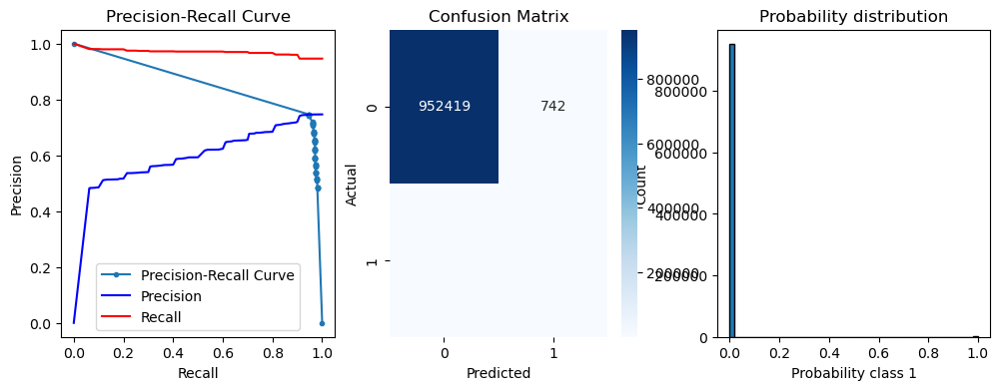

In [40]:
drawPlots(X_test, y_test, y_pred_tree, model_tree)

In [41]:
tresholds = countTresholds(X_test, y_test, model_tree)

Optimal treshold max F1: 1.00000
Optimal treshold max Precision: 1.00000
Optimal treshold max Recall: 0.00000


Treshold max f1 = 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.00      0.00      0.00      1232

    accuracy                           1.00    954393
   macro avg       0.50      0.50      0.50    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [  1232      0]]


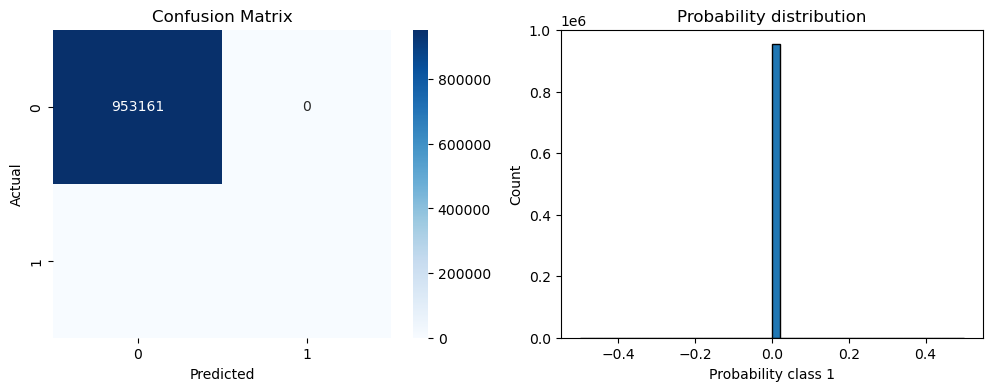

Treshold max precision = 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.00      0.00      0.00      1232

    accuracy                           1.00    954393
   macro avg       0.50      0.50      0.50    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [  1232      0]]


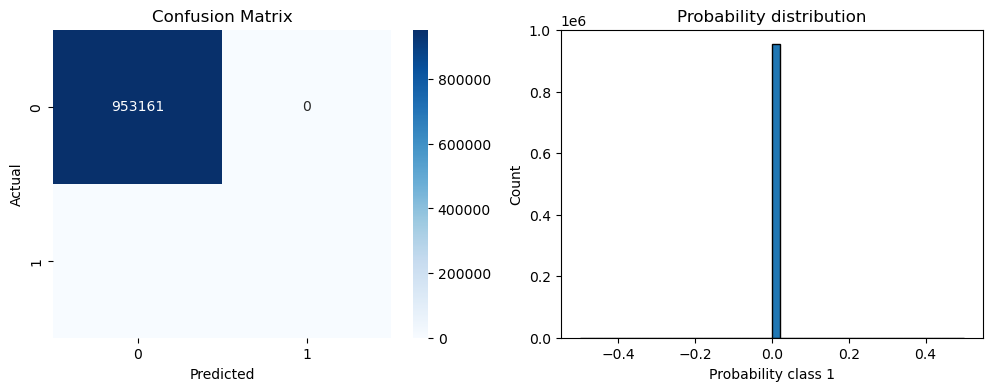

Treshold max recall = 0.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.48      0.98      0.65      1232

    accuracy                           1.00    954393
   macro avg       0.74      0.99      0.82    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[951867   1294]
 [    24   1208]]


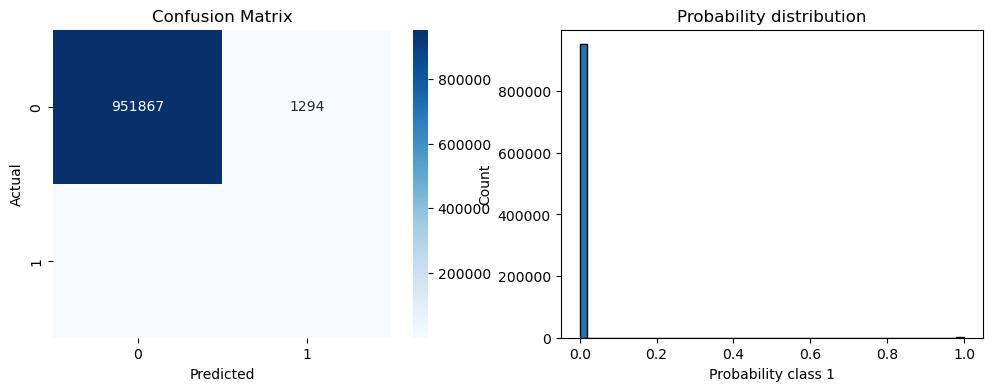

In [42]:
errorMatrix(tresholds, model_tree)

# XGBoost

In [43]:
from xgboost import XGBClassifier

In [72]:
xgboost = XGBClassifier(n_estimators=300, max_depth=6, learning_rate=0.05,
                        subsample=0.7, colsample_bytree=0.7, class_weight='balanced')

In [73]:
xgboost.fit(X_train_sm, y_train_sm.squeeze())

y_pred_xgboost = xgboost.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_xgboost))
print(classification_report(y_test, y_pred_xgboost))
print("Error matrix:")
print(confusion_matrix(y_test, y_pred_xgboost))

Accuracy: 0.9956841678428069
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.23      1.00      0.37      1232

    accuracy                           1.00    954393
   macro avg       0.61      1.00      0.69    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[949048   4113]
 [     6   1226]]


AP:  0.9568549655131272


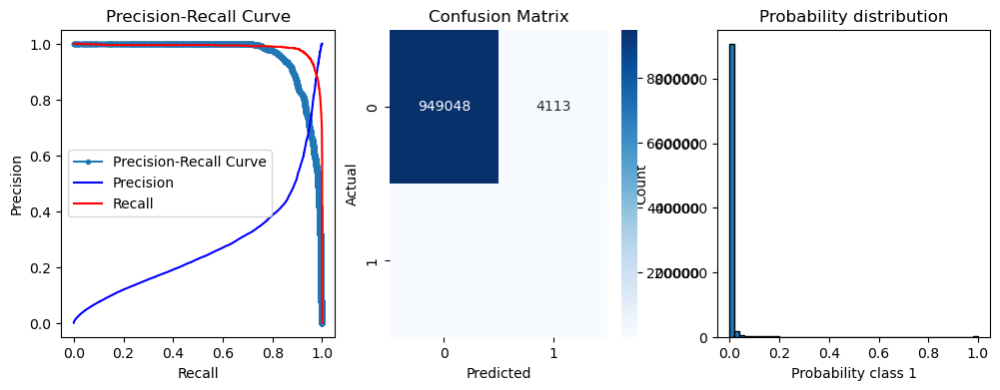

In [74]:
drawPlots(X_test, y_test, y_pred_xgboost, xgboost)

In [75]:
tresholds = countTresholds(X_test, y_test, xgboost)

Optimal treshold max F1: 0.98446
Optimal treshold max Precision: 0.99924
Optimal treshold max Recall: 0.00000


Treshold max f1 = 0.9844619035720825
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.93      0.86      0.90      1232

    accuracy                           1.00    954393
   macro avg       0.97      0.93      0.95    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953085     76]
 [   171   1061]]


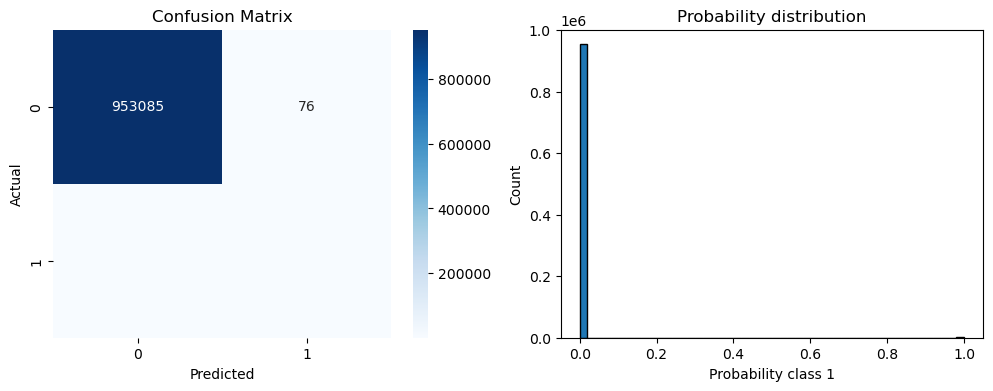

Treshold max precision = 0.9992358684539795
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       1.00      0.66      0.80      1232

    accuracy                           1.00    954393
   macro avg       1.00      0.83      0.90    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [   416    816]]


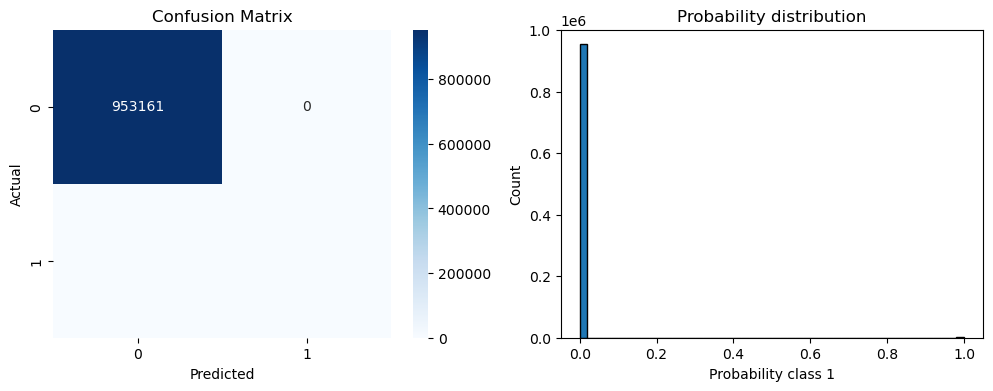

Treshold max recall = 7.02533213825518e-07
              precision    recall  f1-score   support

           0       1.00      0.00      0.00    953161
           1       0.00      1.00      0.00      1232

    accuracy                           0.00    954393
   macro avg       0.50      0.50      0.00    954393
weighted avg       1.00      0.00      0.00    954393

Error matrix:
[[     1 953160]
 [     0   1232]]


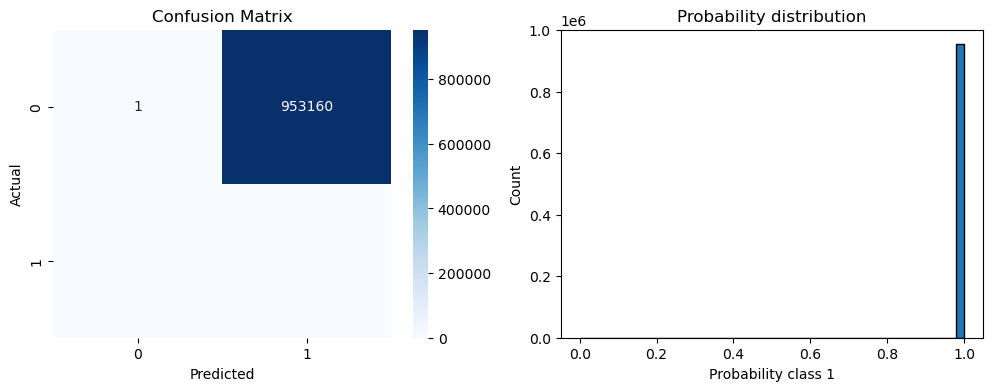

In [76]:
errorMatrix(tresholds, xgboost)

# LGBM

In [49]:
lgbm = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

In [50]:
lgbm.fit(X_train_sm, y_train_sm.squeeze())

y_pred_lgbm = lgbm.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_lgbm))
print(classification_report(y_test, y_pred_lgbm))
print("Error matrix:")
print(confusion_matrix(y_test, y_pred_lgbm))

[LightGBM] [Info] Number of positive: 4448085, number of negative: 4448085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.077019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1418
[LightGBM] [Info] Number of data points in the train set: 8896170, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Accuracy: 0.99510893311246
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.21      0.99      0.34      1232

    accuracy                           1.00    954393
   macro avg       0.60      0.99      0.67    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[948503   4658]
 [    10   1222]]


AP:  0.9545522853620301


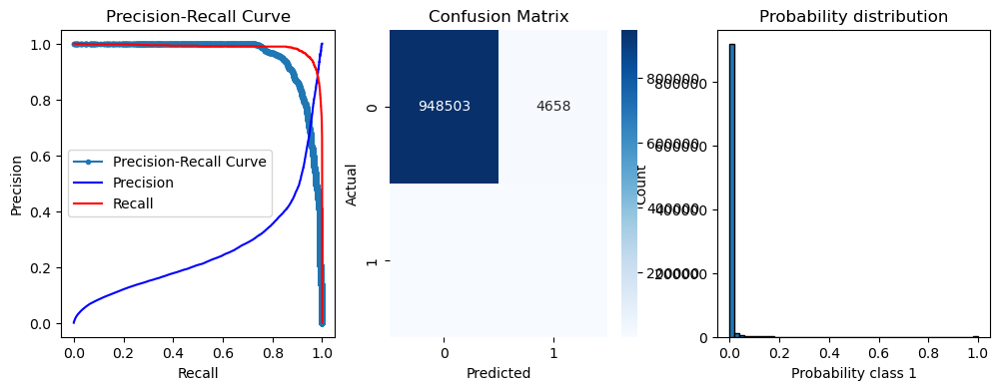

In [51]:
drawPlots(X_test, y_test, y_pred_lgbm, lgbm)

In [52]:
tresholds = countTresholds(X_test, y_test, lgbm)

Optimal treshold max F1: 0.98821
Optimal treshold max Precision: 0.99899
Optimal treshold max Recall: 0.00000


Treshold max f1 = 0.9882076814296655
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.94      0.85      0.89      1232

    accuracy                           1.00    954393
   macro avg       0.97      0.93      0.95    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953088     73]
 [   179   1053]]


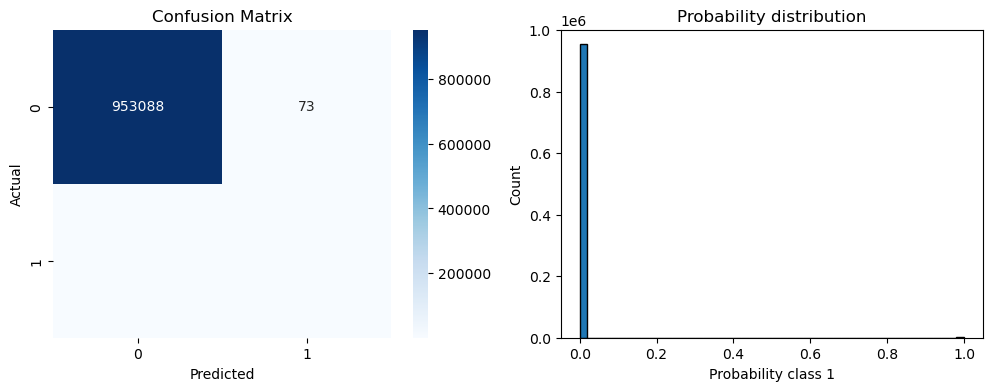

Treshold max precision = 0.998987981469406
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       1.00      0.70      0.82      1232

    accuracy                           1.00    954393
   macro avg       1.00      0.85      0.91    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [   373    859]]


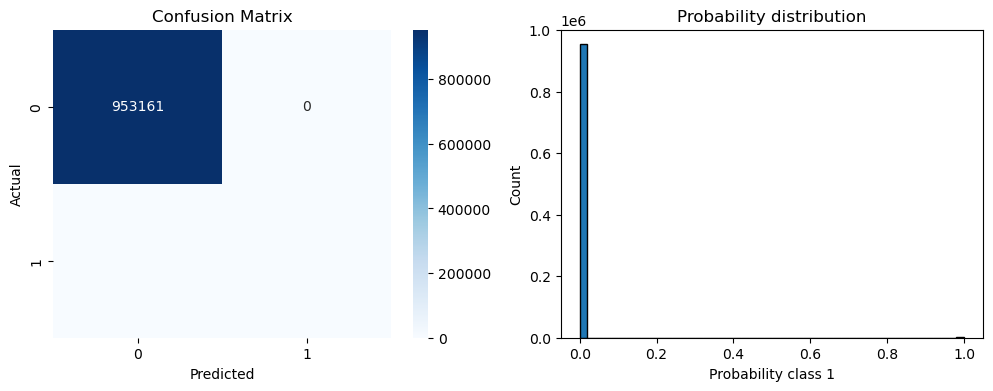

Treshold max recall = 4.93165384759715e-06
              precision    recall  f1-score   support

           0       1.00      0.00      0.00    953161
           1       0.00      1.00      0.00      1232

    accuracy                           0.00    954393
   macro avg       0.50      0.50      0.00    954393
weighted avg       1.00      0.00      0.00    954393

Error matrix:
[[     1 953160]
 [     0   1232]]


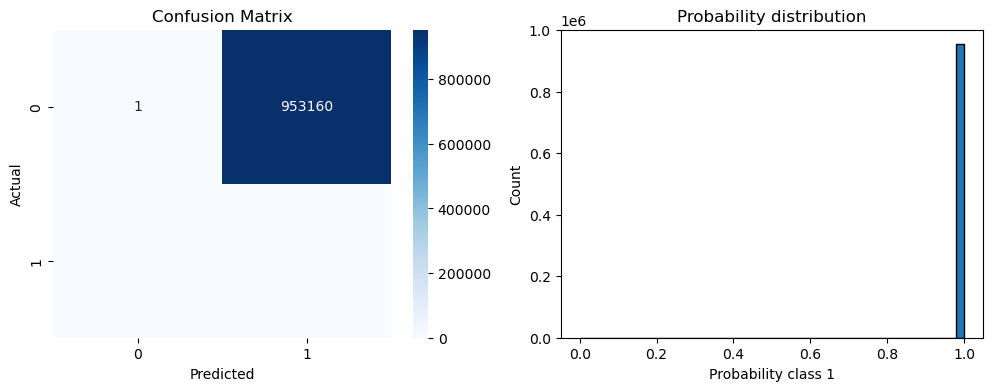

In [53]:
errorMatrix(tresholds, lgbm)

# CatBoost

In [54]:
catboost = cb.CatBoostClassifier(auto_class_weights='Balanced', verbose=0, random_state=42)

In [55]:
catboost.fit(X_train_sm, y_train_sm.squeeze())

y_pred_cb = catboost.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_cb))
print(classification_report(y_test, y_pred_cb))
print("Error matrix:")
print(confusion_matrix(y_test, y_pred_cb))

Accuracy: 0.9971992669686387
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.32      1.00      0.48      1232

    accuracy                           1.00    954393
   macro avg       0.66      1.00      0.74    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[950493   2668]
 [     5   1227]]


AP:  0.9515386862010624


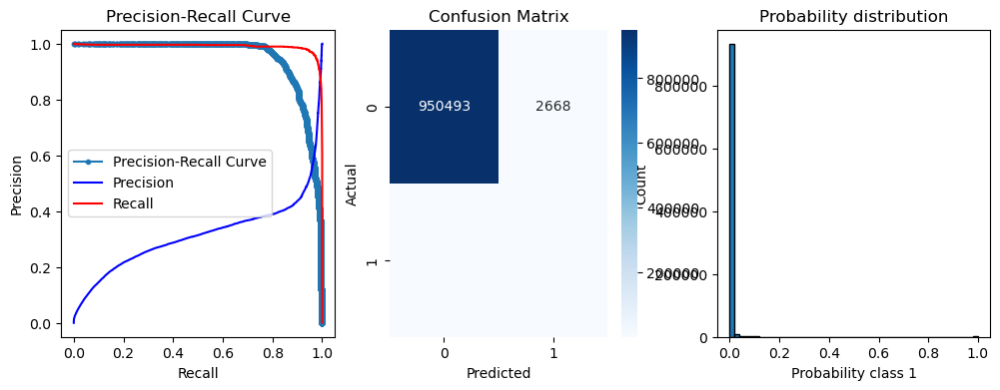

In [56]:
drawPlots(X_test, y_test, y_pred_cb, catboost)

In [57]:
tresholds = countTresholds(X_test, y_test, catboost)

Optimal treshold max F1: 0.99619
Optimal treshold max Precision: 0.99957
Optimal treshold max Recall: 0.00000


Treshold max f1 = 0.9961869360152072
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       0.93      0.84      0.88      1232

    accuracy                           1.00    954393
   macro avg       0.97      0.92      0.94    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953088     73]
 [   197   1035]]


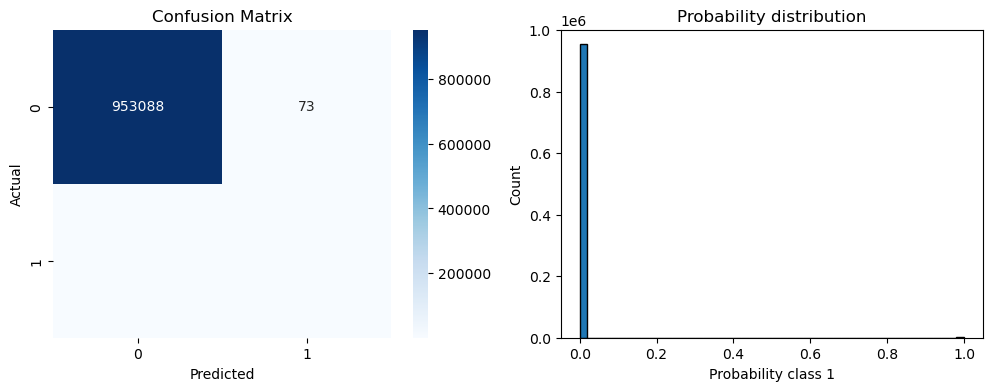

Treshold max precision = 0.999567565232576
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    953161
           1       1.00      0.69      0.81      1232

    accuracy                           1.00    954393
   macro avg       1.00      0.84      0.91    954393
weighted avg       1.00      1.00      1.00    954393

Error matrix:
[[953161      0]
 [   385    847]]


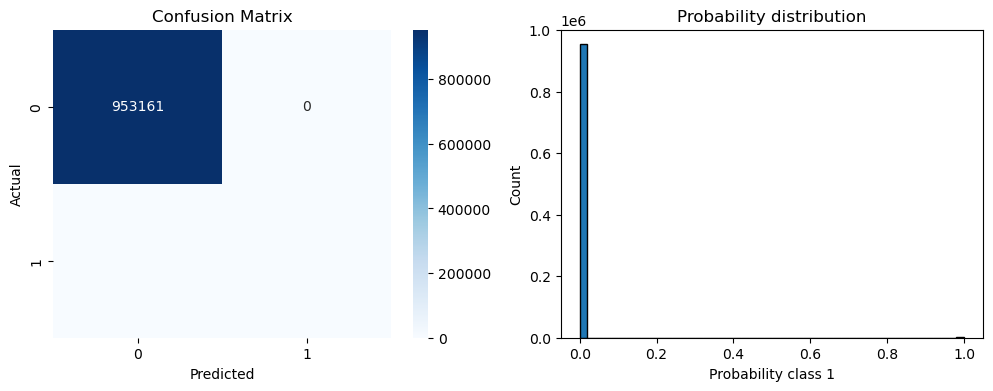

Treshold max recall = 9.940330074477595e-23
              precision    recall  f1-score   support

           0       1.00      0.00      0.00    953161
           1       0.00      1.00      0.00      1232

    accuracy                           0.00    954393
   macro avg       0.50      0.50      0.00    954393
weighted avg       1.00      0.00      0.00    954393

Error matrix:
[[     1 953160]
 [     0   1232]]


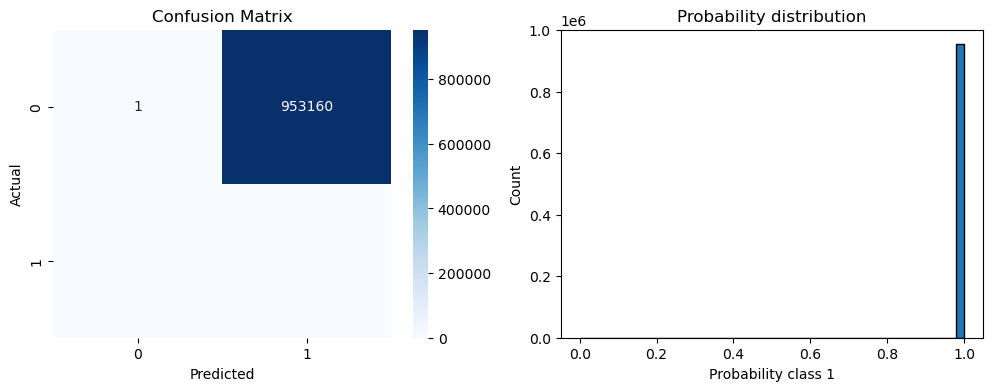

In [58]:
errorMatrix(tresholds, catboost)

In [59]:
def compute_shap(model, X_sample, model_name):
    explainer = shap.LinearExplainer(model, X_sample, feature_perturbation="correlation_dependent")
    shap_values = explainer.shap_values(X_sample)
    shap.summary_plot(shap_values, X_sample, feature_names=df.drop(columns=['isFraud']).columns, show=False, max_display=len(X.columns))
    print(model_name)

In [60]:
def compute_shap_tree(model, X_sample, model_name):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_sample, check_additivity=False)
    shap.summary_plot(shap_values, X_sample, feature_names=df.drop(columns=['isFraud']).columns, show=False, max_display=len(X.columns))
    print(model_name)

Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

Logistic Regression


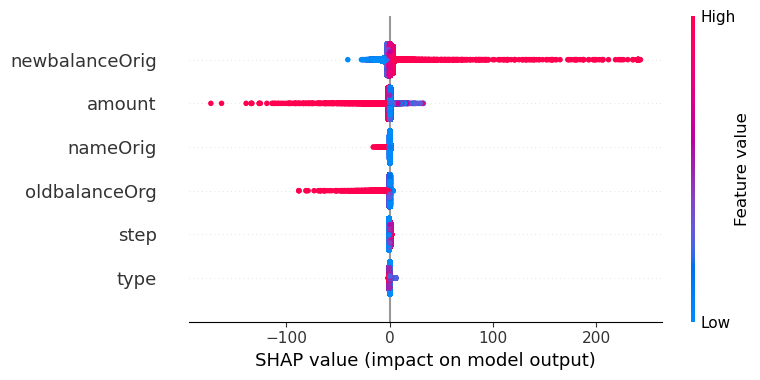

In [61]:
compute_shap(model_log, X_val, "Logistic Regression")

Decision Tree


<Figure size 640x480 with 0 Axes>

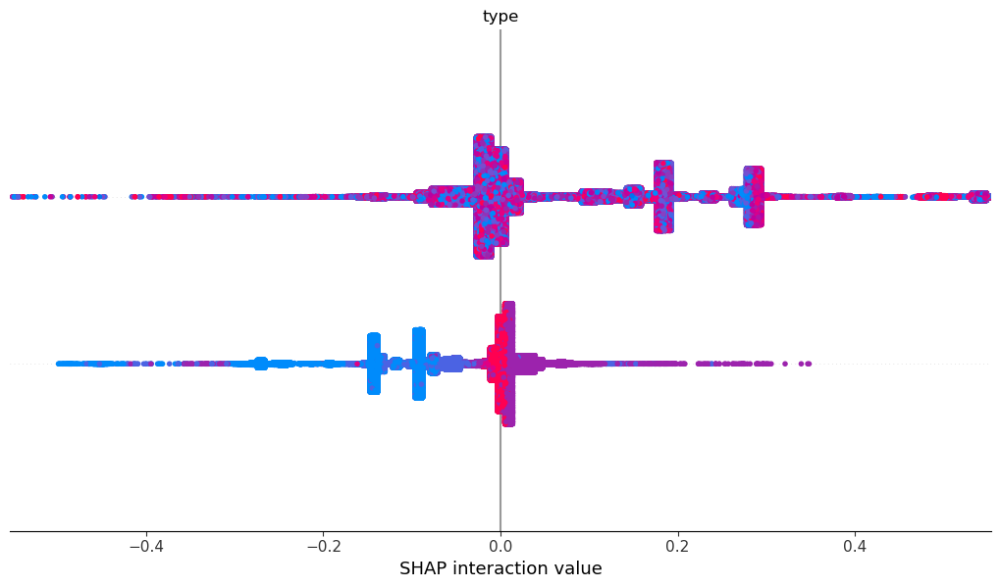

In [62]:
compute_shap_tree(model_tree, X_val, "Decision Tree")

XGBoost


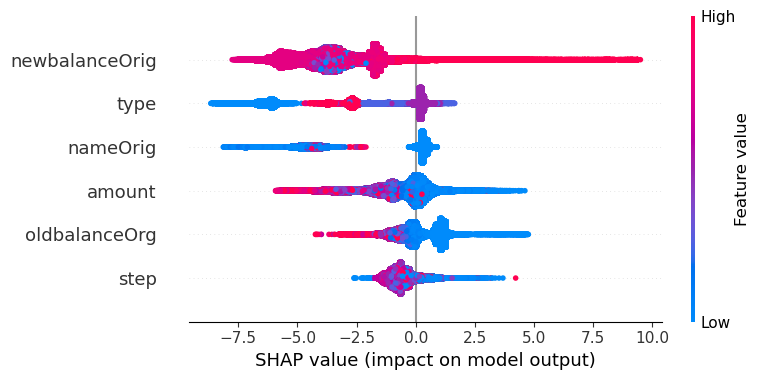

In [63]:
compute_shap_tree(xgboost, X_val, "XGBoost")

LightGBM


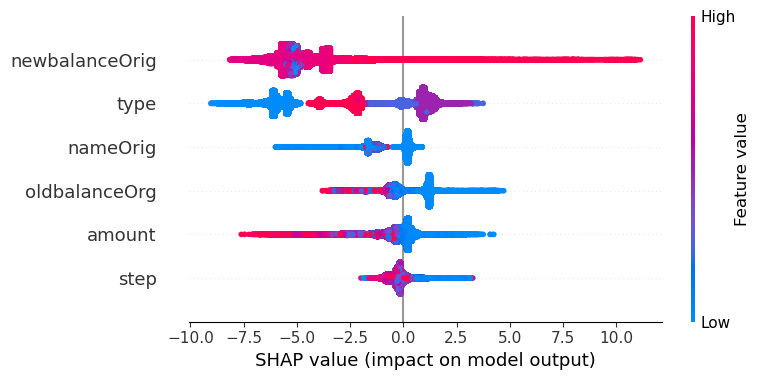

In [64]:
compute_shap_tree(lgbm, X_val, "LightGBM")

CatBoost


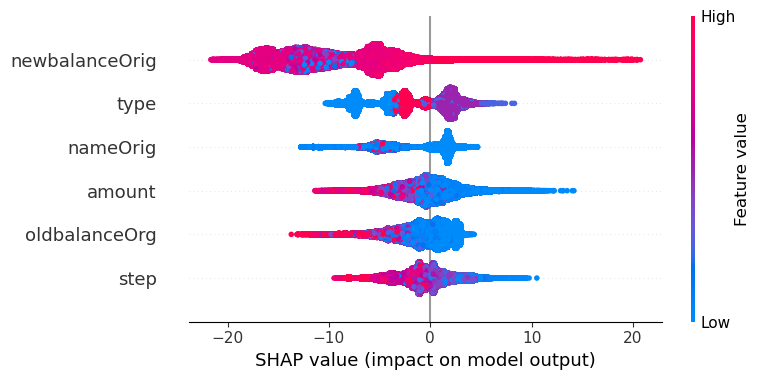

In [65]:
compute_shap_tree(catboost, X_val, "CatBoost")

In [66]:
def compute_lime(model, X_sample, model_name):
    explainer = lime.lime_tabular.LimeTabularExplainer(X_train_sm, feature_names=df.drop(columns=['isFraud']).columns, class_names=['Not Fraud', 'Fraud'], discretize_continuous=True)
    exp = explainer.explain_instance(X_sample[0], model.predict_proba, num_features=len(X.columns))
    exp.show_in_notebook()
    print(model_name)

In [67]:
compute_lime(model_log, X_val, "Logistic Regression")

Logistic Regression


In [68]:
compute_lime(model_tree, X_val, "Decision Tree")

Decision Tree


In [69]:
compute_lime(xgboost, X_val, "XGBoost")

XGBoost


In [70]:
compute_lime(lgbm, X_val, "LightGBM")

LightGBM


In [71]:
compute_lime(catboost, X_val, "CatBoost")

CatBoost


## **Conclusions**

1. **Fraudulent detection**  
   - Fraudulent transactions mainly occur in cash_out and transfer
   - Dataset is highly imbalanced -  only 0.1% of all transactions are fraudulent.
   - The most significant variable for fraud detection are newBalanceOrig and Type.
   - The primary goal is to identify as many fraudulent transactions as possible.
   - Recall is the most important metric, as missing fraudulent transactions is riskier than false alarms. However, achieving a good balance with precision is also desirable.
   

2. **Key Findings from Predictive Modeling**  
* **Logistic regression**
- Treshold = 0.5
    - Accuracy is 95.4% - it's high, but Precission for class 1 is 2%, so it means that model very bad predict fraudulent transactions. Recall for class 1 is 85% - it means that there are a lot of false alarms, because a lot of not fraudulent transactions are classified as fraudulent.
- Treshold = max F1-score = 0.99999
	- This model have F1-score 0.53 and have better precision (75%) and recall (41%) - it means that using this treshold there are less false positives, but there is also less recall, what indicates that 59% fraudulent transactions are missing
- Threshold = max precision = 1.0
	- This model is useless, because all transactions are predicted as not fraudulent.
- Treshold = max recall = 7.545283256947686e-108
	- This model is useless, because all transactions are predicted as fraudulent
- Logistic regression is not the best model to predict fraudulent transactions.
- AP=4829

* **Decision Tree**
- Treshold = 0.5
	- Accuracy is very high 99.92% and recall is 97% - it means that most of fraudulent transaction are detected, but precision is 62%, so there is a lot of false positives - a lot of not fraudulent transaction is detected as fraudulent.
- Treshold = max F1-score = 1.0
	- Model is useless, because it can't predict fraudulent transactions.
- Treshold = max precision = 1.0
	- Model is useless, it can't predict fraudulent transactions.
- Treshold = max recall = 0.0
	- For class 1 model have recall 98%, so it detects most of fraudulent, but only recall = 48%, so 48% of detected transactions are really fraudulent. It means that there are almost half of the flagged frauds are false alarms.
 - AP=7292

* **XGBoost**
- Treshold = 0.5
	- Accuracy is 99.56%, but precision for class 1 is only 2%, so it means that model predict very bad fraudulent.
- Treshold = max F1-score = 0.98446
	- F1-score is 0.90, but precision is 93% and recall is 86%, so model is quite good in predicing fraudulent transactions, and 14% of these prediction was false positive.
- Treshold = max precision = 0.99923
	- Precision 100% indicates that all fraudulent transaction is detected, but recall 66% means, that 34% transaction, which was predicted as fraudulent, was not fraudulent.
- Treshold = max recall = 7.02533213825518e-07
	- Recall is 100%, but this model is useless, because almost all transaction was predicted as fraudulent.
 - AP=9568

* **LightGMB**
- Treshold = 0.5
	- Accuracy is very high - 99.51% and model have high recall - 0.99%, so most of predicted fraudulent transaction was really fraudulent, but precision is 21%, so only 21% of flagged frauds are real.
- Treshold = max F1-score = 0.98821
	- F1-score is 0.89 and model have better precision (94%) and recall (85%), so 15% of fraudulent transaction was not detected. F1-score is 0.89 so it's quite high.
- Treshold = max precision = 0.99899
	- Precision is 100%, so all fraudulent transaction was detected correctly, but recall 70% means, that 30% of transaction predicted as fraudulent was false positive. F1-score (0.82) is smallest than in previous one model.
- Treshold = max recall = 4.93165e-06
	- Recall is 100%, but model is useless, because all transaction is set as fraudulent.
 - AP=9545

* **CatBoost**
- Treshold = 0.5
	- Accuracy is 99.72% - it's high and recall is 100%, but precision 32% means, that model detect only 32% of fraudulent.
- Treshold = max F1-score = 0.99619
	- Precision 93% and recall 84% are high and F1-score is 88% - model balances precision and recall well.
- Treshold = max precision = 0.99951
	- Precision is 100%, but recall is only 69%, so model don't detect a lot of fraudulent.
- Treshold = max recall = 9.9403e-06
	- Recall is 100%, but model detect all transaction as fraudulent.
 - AP=9515

3. **Conclusions**  
   - The best model is LightGBM, CatBoost and XGBoost with treshold max F1-score.
   - The highest AP have XGBoost.
   - Most models failed when prioritizing recall-only strategies.
  
4. **Future Work and Improvements**
   - Hyperparameter tuning to improve recall-precision tradeoff.
   - Experimenting with another sampling strategies (oversampling, undersampling)
   - Exploring advanced anomaly detection techniques.



